<h2><center>Прогнозирование временных рядов</center></h2>

In [ ]:
!pip install -r requirements.txt

In [ ]:
import warnings
import gdown
import pandas as pd
import numpy as np
from copy import deepcopy
from etna.analysis import acf_plot
from etna.analysis import cross_corr_plot
from etna.analysis import distribution_plot
from etna.analysis import plot_correlation_matrix
from etna.transforms import LagTransform
from etna.transforms import LinearTrendTransform
warnings.filterwarnings("ignore")

В данной задаче мы будем решать одну из актуальных практических задач, с которыми, в том числе, сталкиваются разработчики ETNA - прогнозирование объема необходимой наличности в банкоматах. Пожалуй, ни для кого не секрет, что отсутствие необходимой суммы в банкомате не делает клиента банка счастливее. В то же время, избыток заправленной в банкомат наличности приводит к упущенной выгоде - ведь, в конечном счете, эти деньги могли быть размещены в качестве краткосрочного депозита на межбанковском рынке. Для кредитной организации с обширной сетью банкоматов даже незначительное улучшение качества предсказания способно внести значительный вклад в прибыльность этой ветки бизнеса.

В качестве инструмента воспользуемся библиотекой ETNA, документацию можно прочитать [тут](https://docs.etna.ai/stable/), и [чат](https://t.me/etna_support) комьюнити.

Мы будем использовать дневные данные реальных банкоматов для чего возьмем мультисегментный датасет.

In [ ]:
url = 'https://gist.githubusercontent.com/Polzovat123/4d6d5e544e93429c2d3db29196e9c918/raw/24b27e60f587128d71678e267f51cd48472c6a84/atms_daily_cash.csv'
output = 'atms_daily_cash.csv'
gdown.download(url=url, output=output, quiet=False, fuzzy=True)

df = pd.read_csv('atms_daily_cash.csv', index_col=False)

Downloading...
From: https://gist.githubusercontent.com/Polzovat123/4d6d5e544e93429c2d3db29196e9c918/raw/24b27e60f587128d71678e267f51cd48472c6a84/atms_daily_cash.csv
To: /content/atms_daily_cash.csv
100%|██████████| 258k/258k [00:00<00:00, 7.41MB/s]


Полученные данные были просуммированы по банкоматам и дням эксплуатации, после чего залиты в gist, откуда мы и берем их.

Взглянем на то, что представляют из себя данные после этих действий:

In [ ]:
df.head()

,datetime,atm_id,operation_value
0,2017-08-16,74,2.059266
1,2017-08-17,74,1.029633
2,2017-08-18,74,0.686422
3,2017-08-19,74,33.301267
4,2017-08-20,74,-12.237921


### EDA


In [ ]:
from etna.datasets import TSDataset

In [ ]:
# чтобы говорить на одном языке с этной переименуем столбцы
df.rename(columns={'datetime': 'timestamp', 'operation_value': 'target', 'atm_id': 'segment'}, inplace=True)
ts = TSDataset(df, freq="D")
ts1 = TSDataset(df, freq="D")
ts2 = TSDataset(df, freq="D")
ts3 = TSDataset(df, freq="D")
ts.head(5)

segment,100,101,102,103,104,105,106,74,85,86,87,88,90,91,93,94,96,97,98,99
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2017-06-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.617780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.441486,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.235345,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-13.532317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.398647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Сначала глянем на простые графички, поищем там каких-нибудь закономерностей

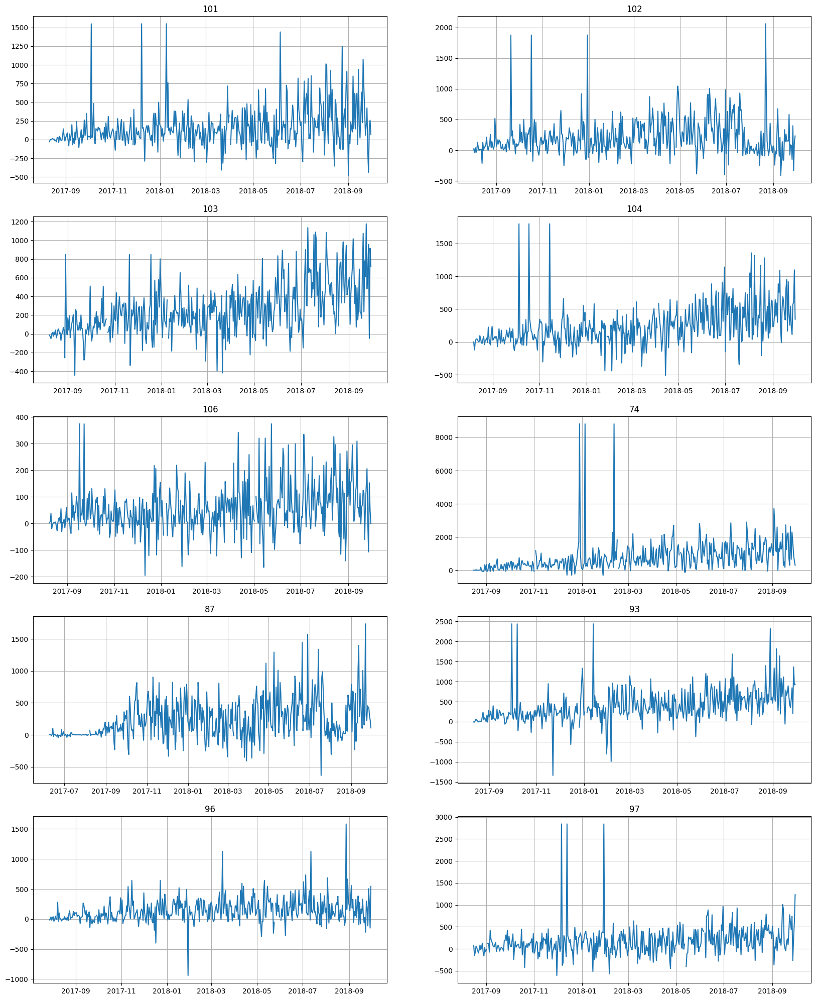

In [ ]:
ts.plot()

Так, конечно, мало что можно понять. Можно отметить, что на нескольких графиках наблюдалось много денег в районе сентября и января. Возможно, это связанно с праздниками в эти периоды - родственники кладут денежку чтобы перевести ее младшим членам семьи на день знаний, родственники кладут деньжата чтобы передарить их потом родным из других городов. Для нормального анализа нужно смотреть дальше

Давайте теперь посмотрим на тренды, это куда интереснее должно быть (рассматриваются полиномы 1, 2, 3 степеней)

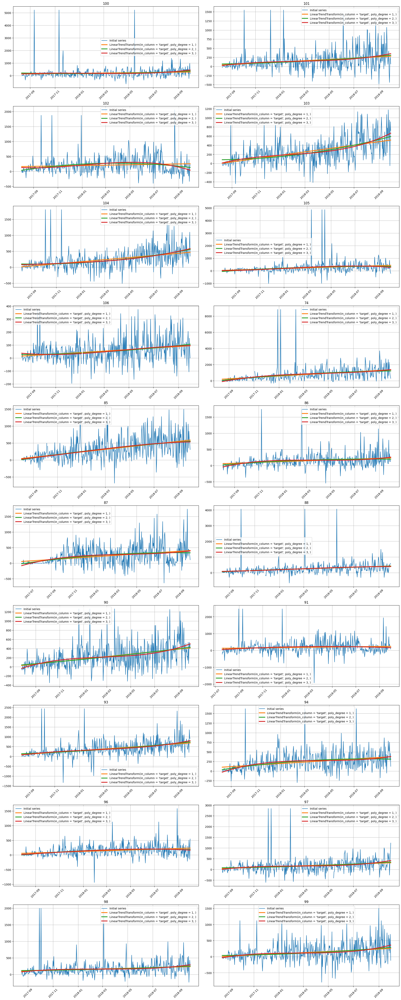

In [ ]:
from etna.analysis import plot_trend
trends = [
    LinearTrendTransform(in_column="target", poly_degree=1),
    LinearTrendTransform(in_column="target", poly_degree=2),
    LinearTrendTransform(in_column="target", poly_degree=3),
]
plot_trend(ts, trend_transform=trends)

Глазками замечаем что тренд у банкоматов  восходящий (где-то сильнее, где-то слабее) и только у 102 банкомата начался нисходящий тренд в полиномах 2й и 3й степени. Это может говорить о том, что люди со временем все больше переходят на безналичные способы оплаты

Хотим еще посмотреть на сезонность - давайте посмотрим

In [ ]:
from etna.analysis import seasonal_plot

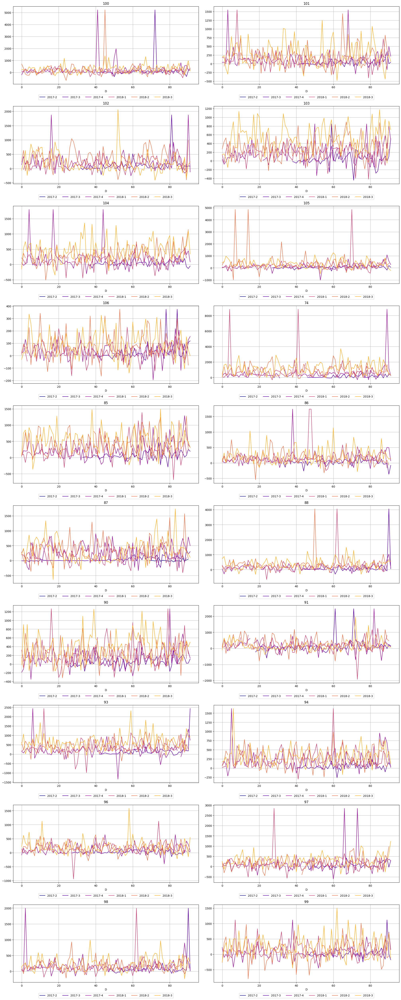

In [ ]:
seasonal_plot(ts=ts, cycle="quarter")

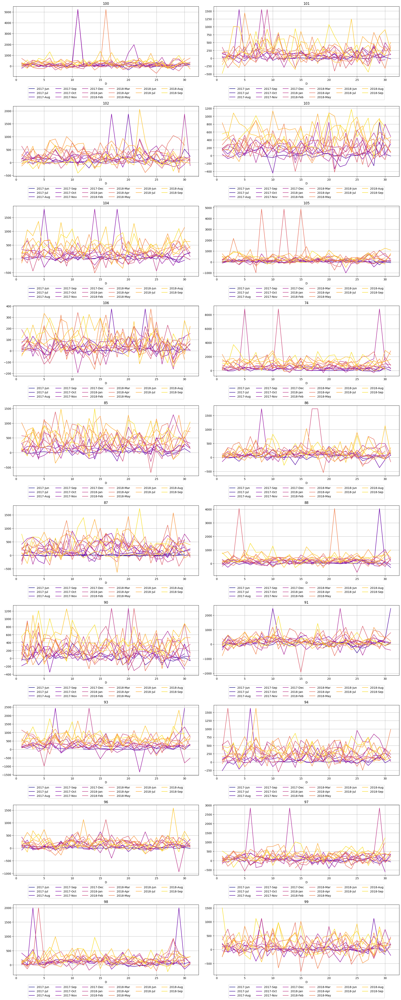

In [ ]:
seasonal_plot(ts=ts, cycle="month")

Сезонность не обнаружена

Попробуем посмотреть на корреляции между временными рядами

In [ ]:
lags = LagTransform(in_column="target", lags=[1, 7], out_column="lag")
ts1.fit_transform([lags])

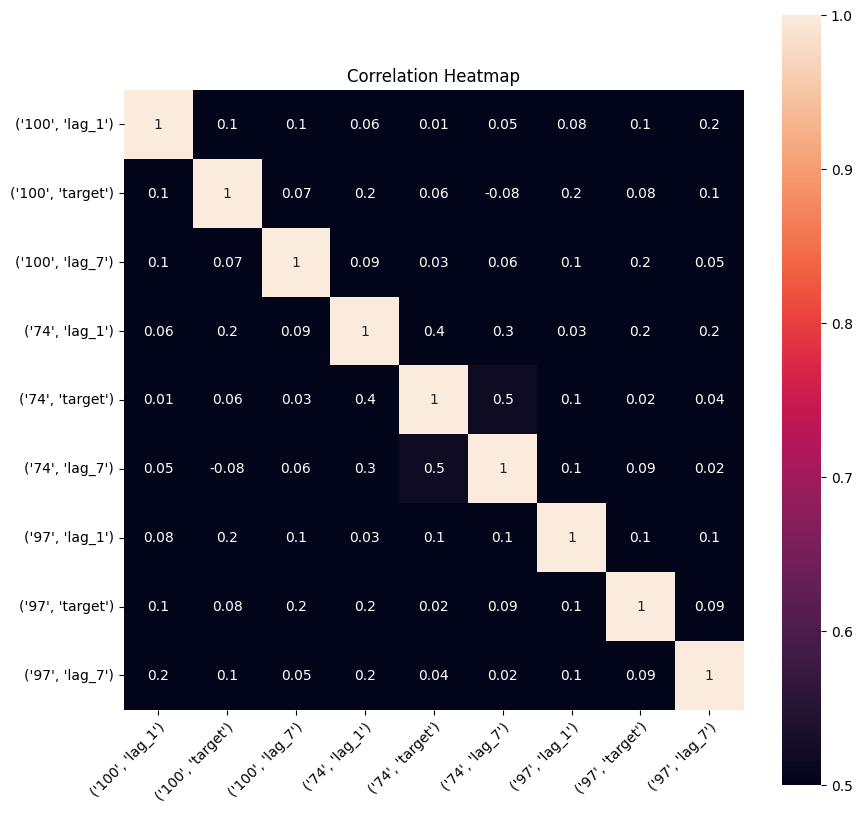

In [ ]:
plot_correlation_matrix(ts1, segments=["100", "74", "97"], method="spearman", vmin=0.5, vmax=1)

Видим супер низкую корреляцию между тремя случайно-выбранными банкоматами, можно делать вывод об отсутствии корреляции между временными рядами разных банкоматов

Чтобы не быть голословными построим еще кросс-корреляцию

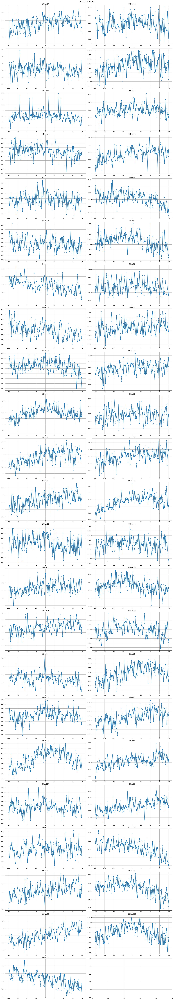

In [ ]:
cross_corr_plot(ts, maxlags=100)

Чтобы утверждать о взаимосвязи рядов, значения кросс-корреляционной функции должно стремится к единице. У нас же только у нескольких пар значение превысило 0.6, значит отвергаем гипотезу о наличии корреляции между временными рядами

Посмотрим еще на автокорреляциию

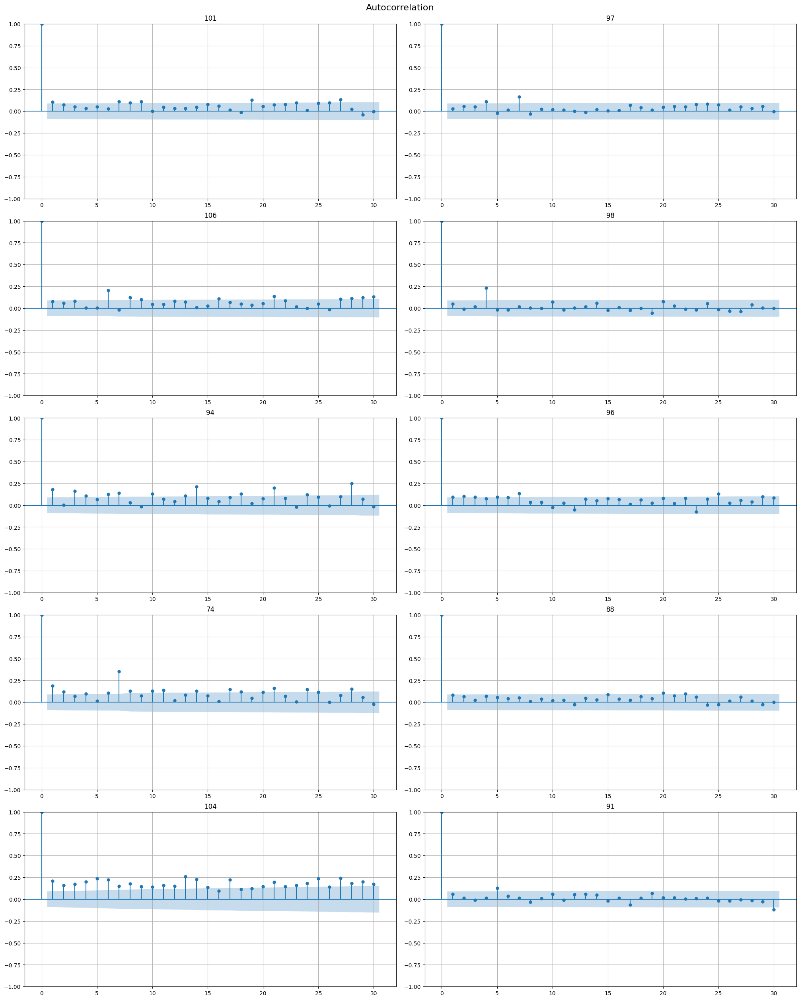

In [ ]:
acf_plot(ts, lags=30)

Замечен для нескольких временных рядов значимый седьмой лаг - это позволяет говорить о недельной сезонности (которую было бы сложно отследить через графики сезонности, хорошо что решили использовать этот инструмент). Вообще, недельная сезонность звучит здраво, исходя из житейского опыта